In [2]:
import pandas as pd
import json

In [3]:
with open('./data.json','r') as f:
    data = f.readlines()

In [5]:
# datum = json.loads(data[0])
# datum

# data[0]['payload']['details']['players'][0]['onCourt']

In [ ]:
import json

def parse_player_data(data):
    # # Load the JSON data from the specified file
    # with open(file_path, 'r') as file:
    #     data = json.load(file)
    
    # Extract players' information
    players = data['payload']['details']['players']
    samples = data['payload']['samples']['people']

    # Create a dictionary to store parsed player data
    parsed_data = []

    for player in players:
        player_id = player['id']['nbaId']
        full_name = player['fullName']
        jersey_number = player['jerseyNumber']
        on_court = player['onCourt']
        reason_not_on_court = player.get('notOnCourtReason', 'N/A')

        # print(player_id)
        # Find corresponding joint and centroid data
        for sample in samples:
            if sample['playerId']['nbaId'] == player_id:
                centroid = sample['centroid']
                joints = sample['joints']
                # print(centroid, joints)

                # Create a dictionary for each player
                player_info = {
                    'id': player_id,
                    'fullName': full_name,
                    'jerseyNumber': jersey_number,
                    'onCourt': on_court,
                    'notOnCourtReason': reason_not_on_court,
                    'centroid': centroid,
                    'joints': joints
                }

                parsed_data.append(player_info)

    return parsed_data

# Example usage
parsed_data = parse_player_data(datum)

# Convert parsed data to JSON format and print
# print(json.dumps(parsed_data, indent=2))
parsed_data

{1629023: [{'lAnkle': [13.619, -103.258, 5.506], 'lEar': [27.381, -94.553, 69.188], 'lElbow': [21.568, -102.986, 47.308], 'lEye': [28.372, -89.428, 68.12], 'lHip': [28.833, -104.678, 38.906], 'lKnee': [20.935, -99.537, 24.424], 'lShoulder': [23.849, -97.697, 60.791], 'lWrist': [20.668, -99.547, 36.002], 'neck': [31.396, -95.571, 61.636], 'nose': [29.507, -89.062, 65.96], 'rAnkle': [51.082, -109.986, 5.525], 'rEar': [34.215, -92.698, 69.168], 'rElbow': [44.119, -100.736, 47.146], 'rEye': [30.918, -88.75, 68.075], 'rHip': [36.906, -103.555, 39.104], 'rKnee': [45.155, -102.841, 23.939], 'rShoulder': [38.983, -95.79, 59.958], 'rWrist': [45.471, -98.459, 35.697], 'midHip': [32.871, -104.189, 39.354], 'lHeel': [13.248, -104.872, 1.302], 'lBigToe': [13.902, -92.992, 1.935], 'lSmallToe': [11.09, -94.468, 2.082], 'lThumb': [22.012, -97.562, 33.4], 'lPinky': [19.236, -99.497, 31.524], 'rHeel': [51.252, -111.884, 1.875], 'rBigToe': [54.425, -100.56, 1.26], 'rSmallToe': [56.448, -102.964, 1.865], 

  2%|▏         | 20/999 [00:00<00:29, 33.01it/s]/tmp/ipykernel_70065/1246757592.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15, 12))
 30%|███       | 303/999 [00:09<00:22, 30.60it/s]


KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x770f40096b60> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

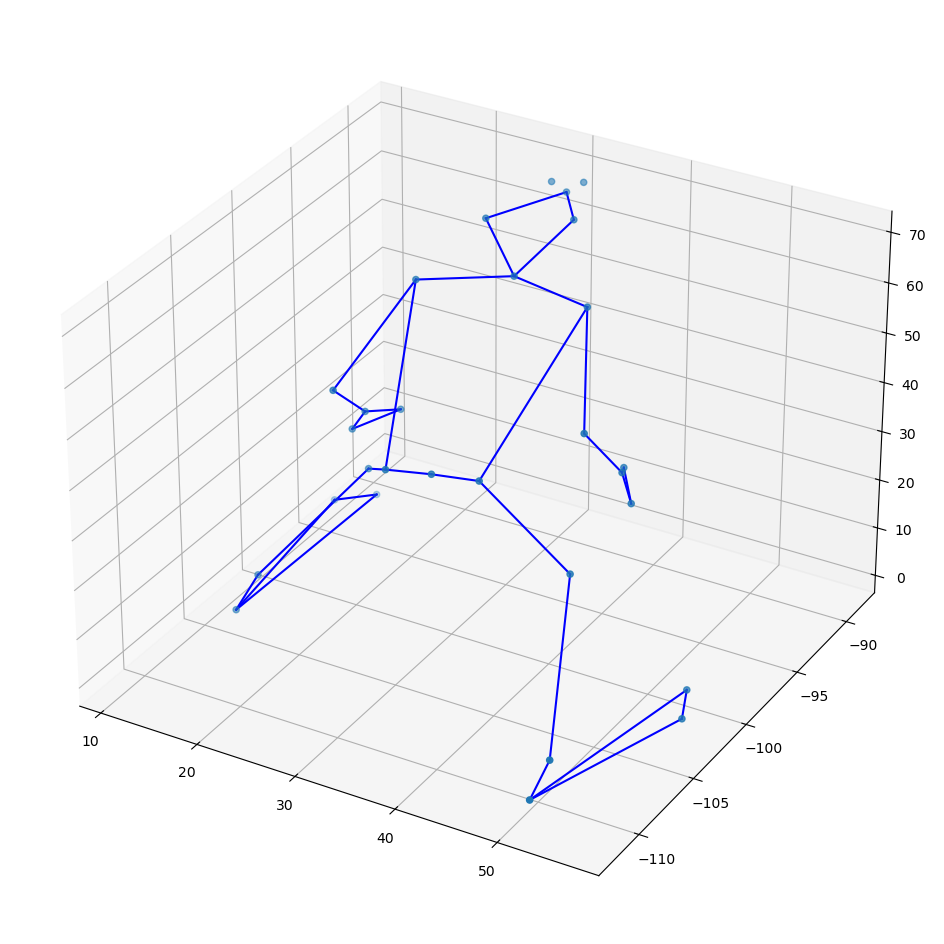

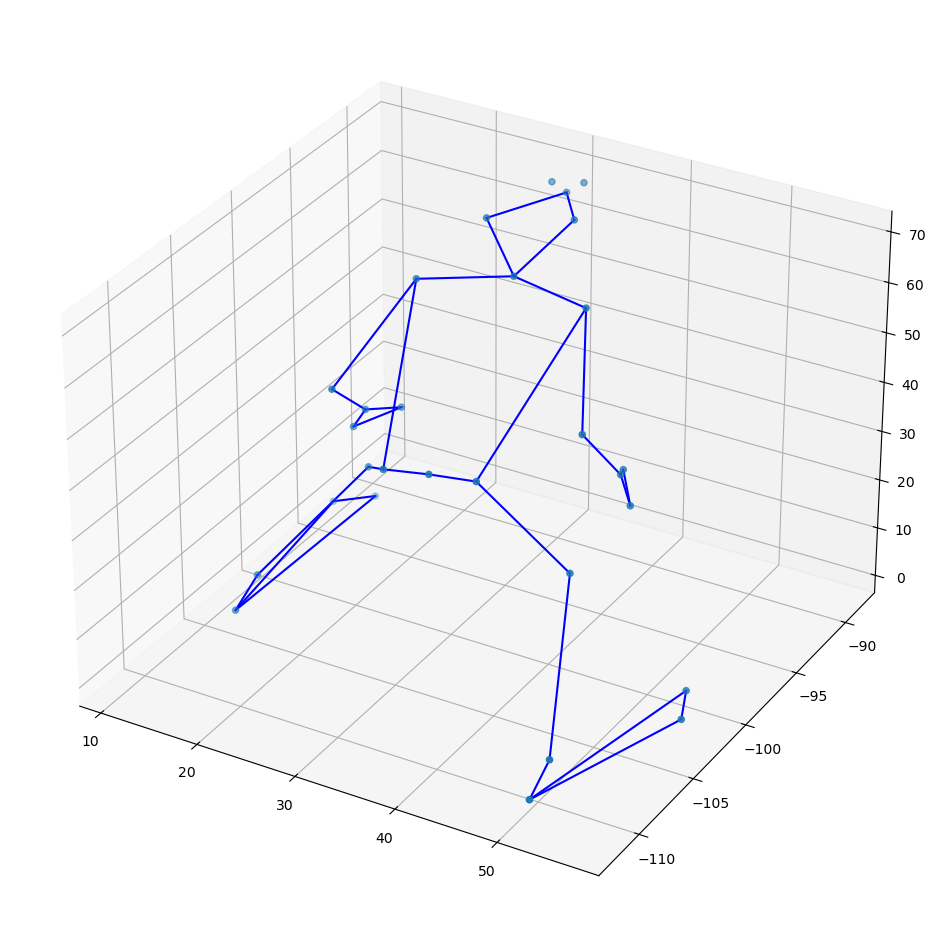

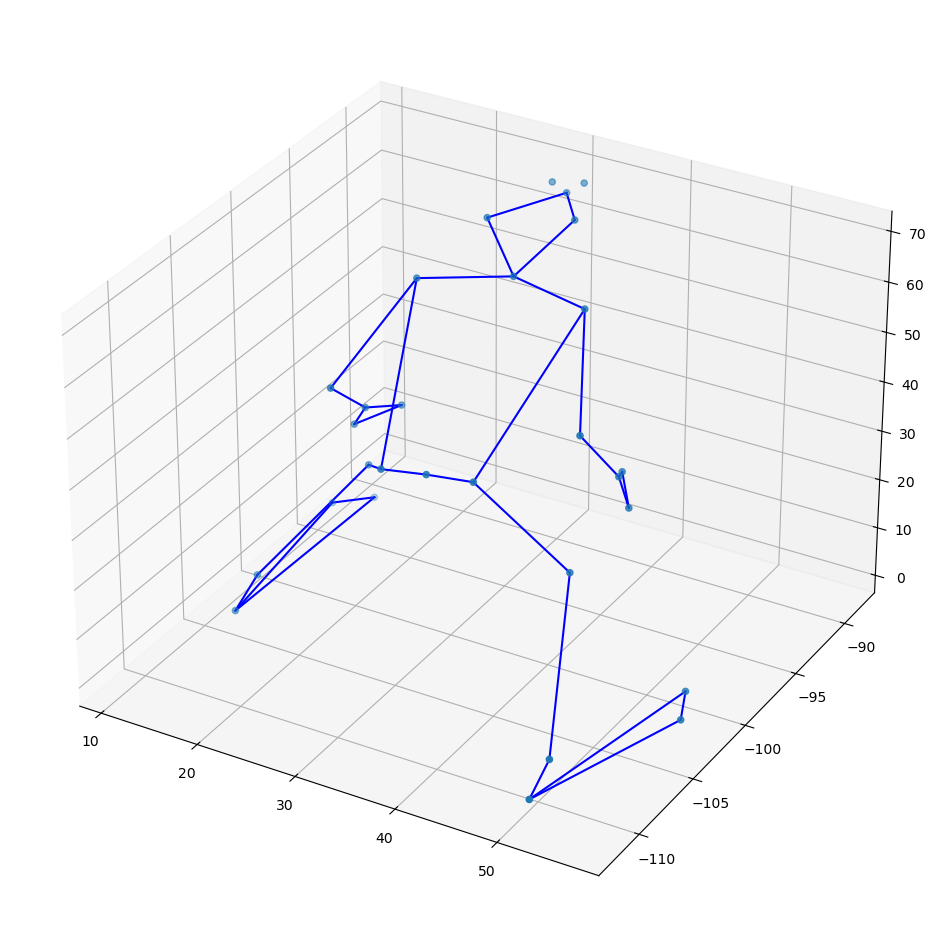

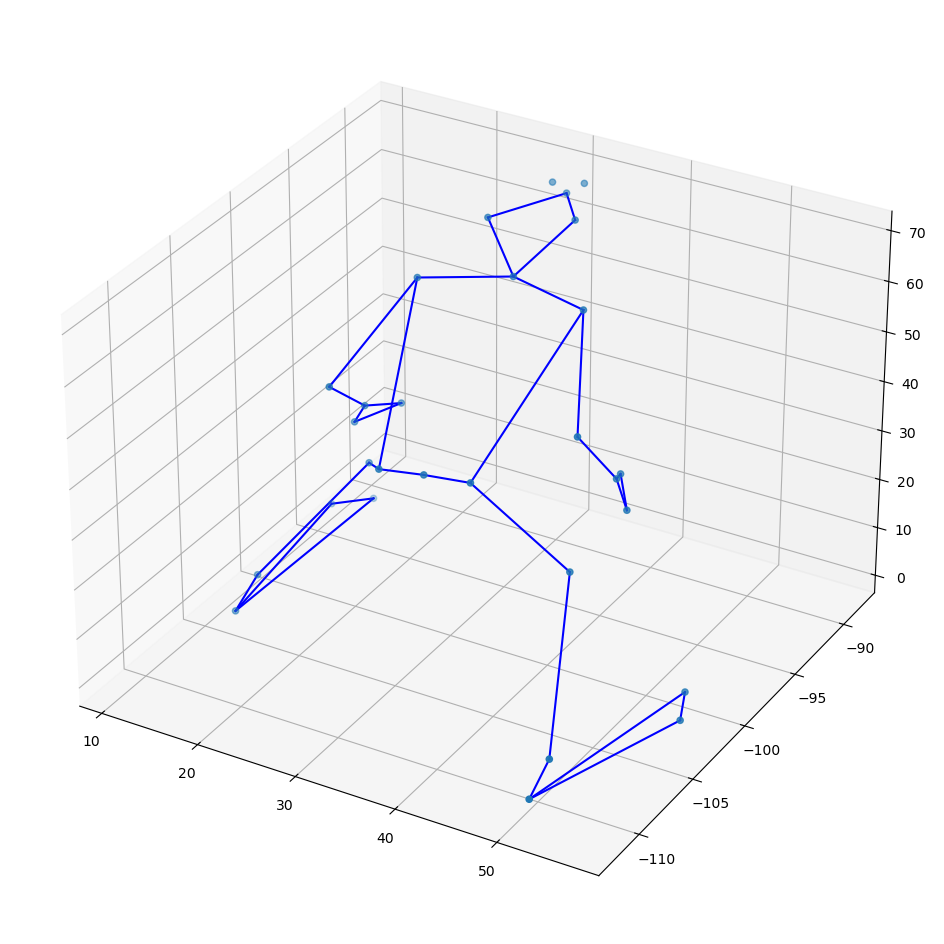

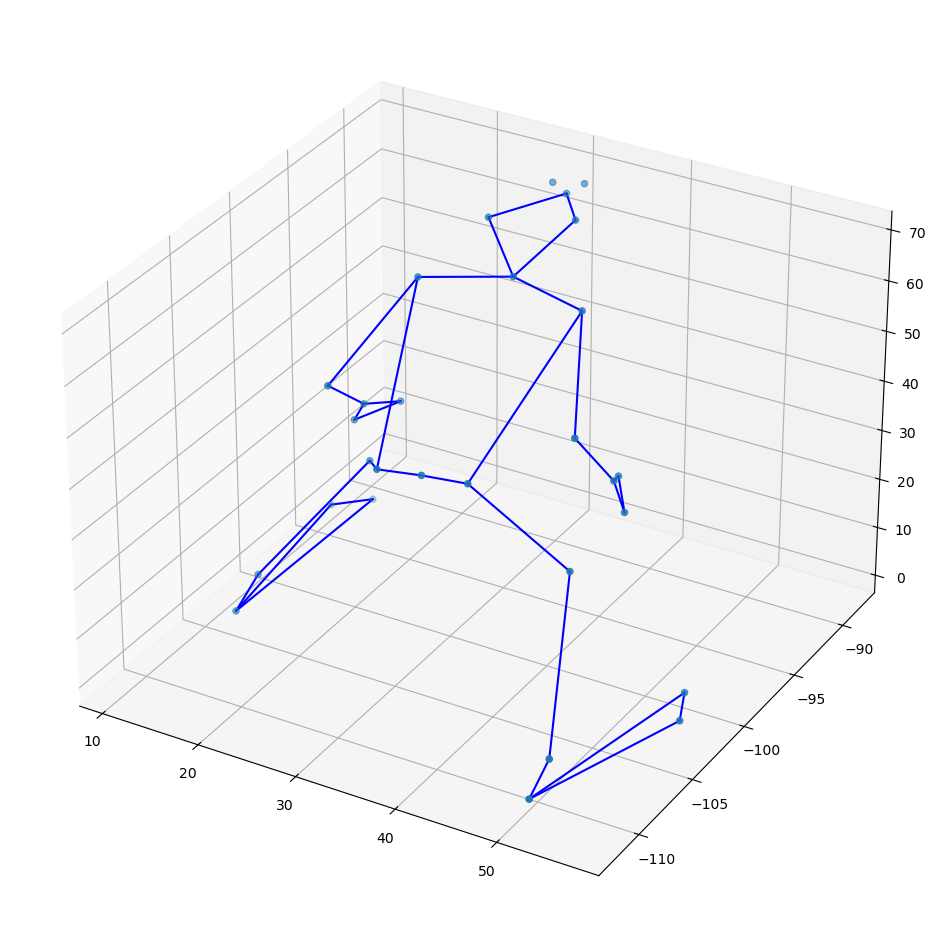

...

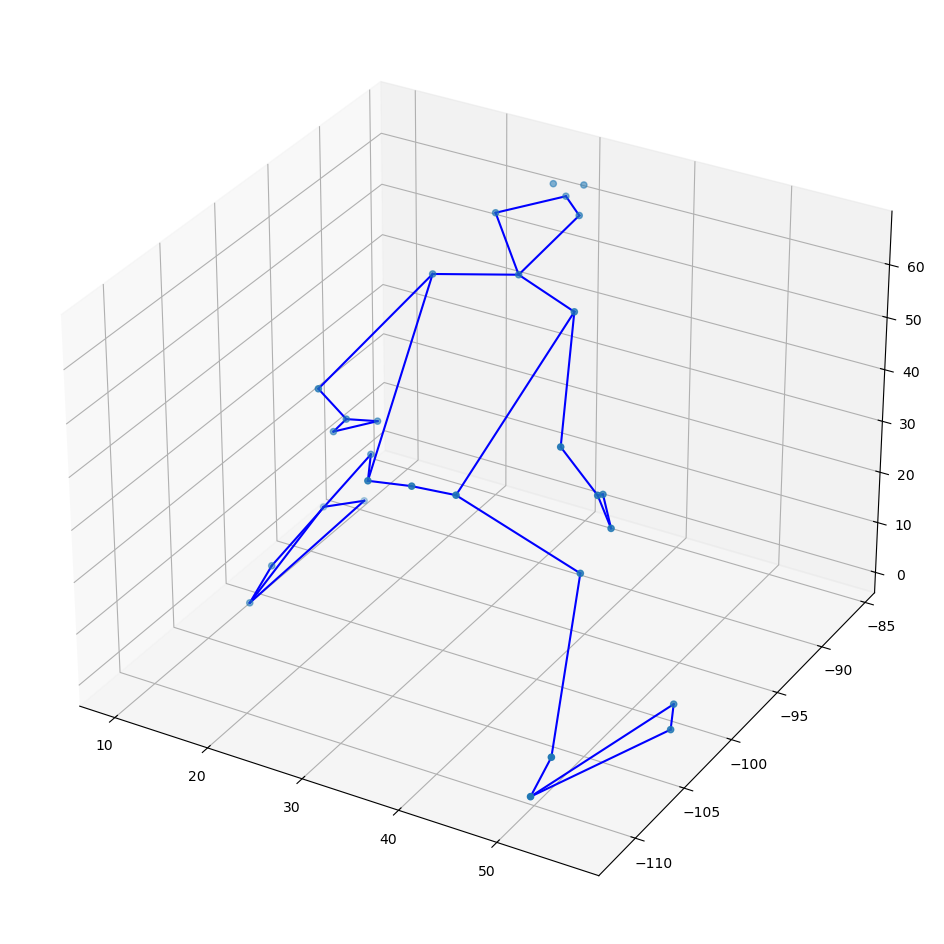

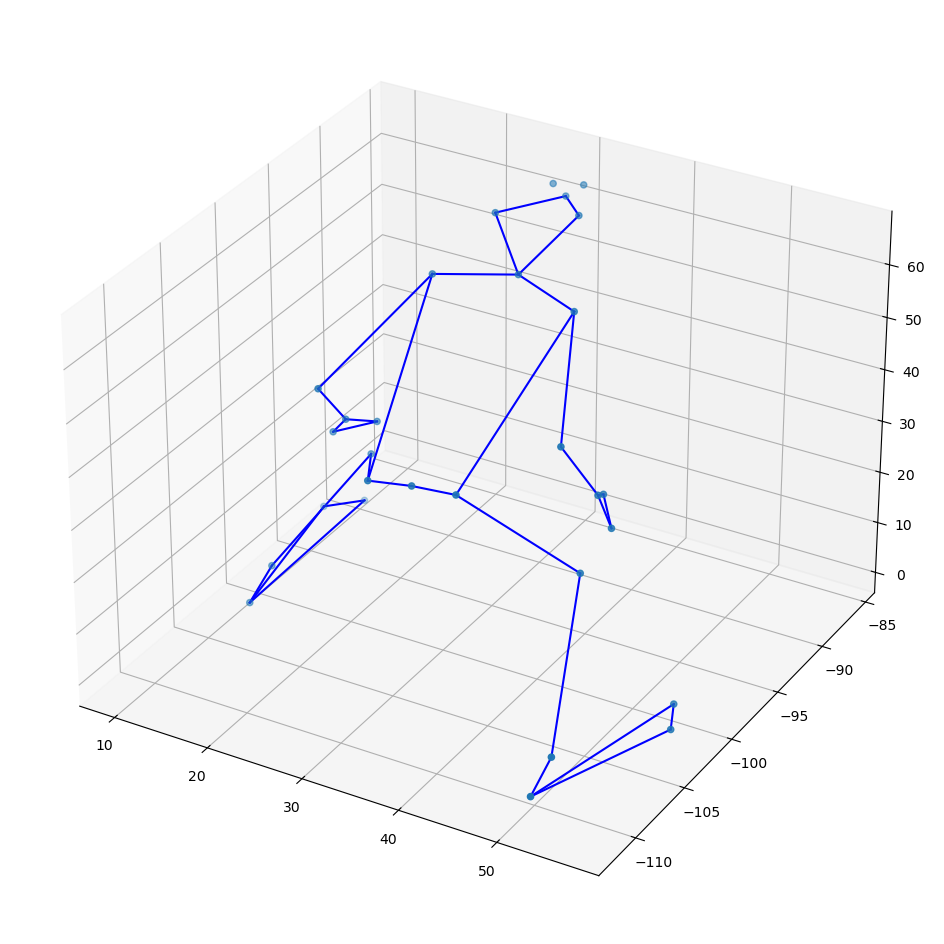

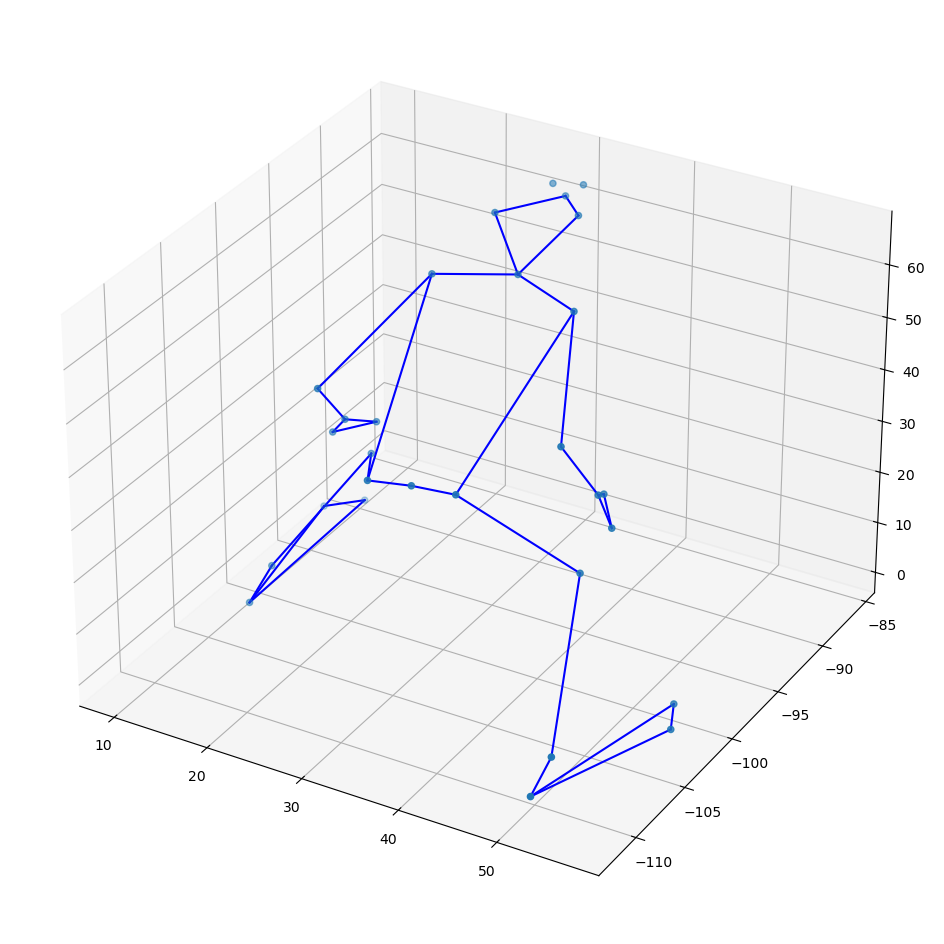

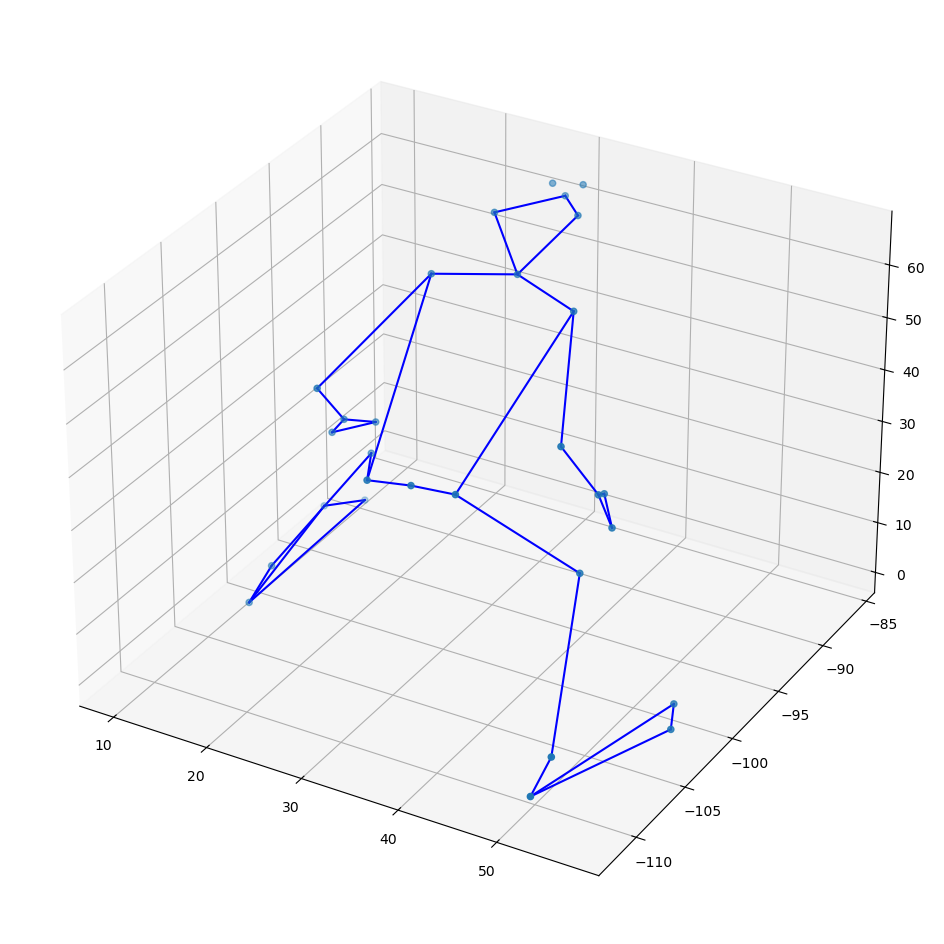

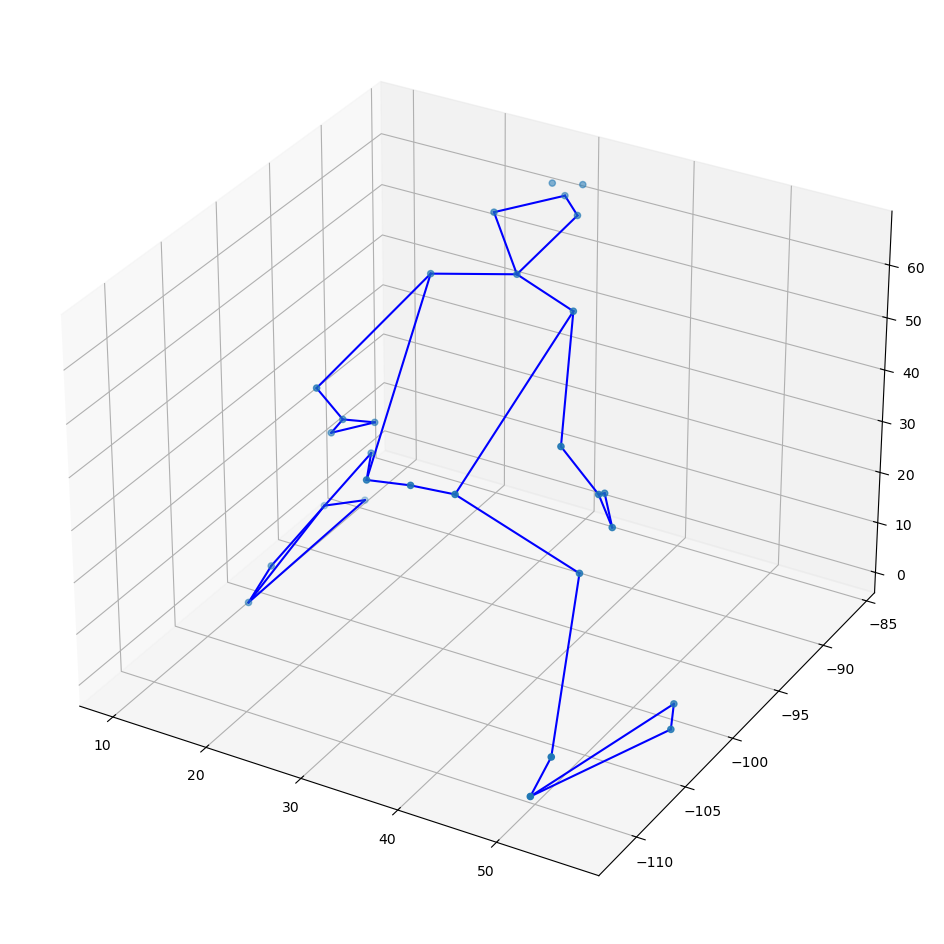

In [6]:
import json
import numpy as np
import matplotlib.pyplot as plt
import cv2
from  tqdm import tqdm

def visualize_player_joints_to_video(DATA, player_id, output_file='player_joints_video.avi'):
    # Extract joint positions over time for the specified player
    joint_data = {}

    
    for data in DATA:
        players = [player['id']['nbaId'] for player in data['payload']['details']['players'] if player['onCourt']]
        for sample in data['payload']['samples']['people']:
            if sample['playerId']['nbaId'] in players:
                if sample['playerId']['nbaId'] not in joint_data:
                    joint_data[sample['playerId']['nbaId']] = []
                else:
                    joint_data[sample['playerId']['nbaId']].extend(sample['joints'])

    print(joint_data)

    # Prepare to create video
    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    fps = 60  # Frames per second
    frame_size = (640, 480)  # Size of the video frames
    out = cv2.VideoWriter(output_file, fourcc, fps, frame_size)

    # Create frames for each set of joints
    for key,val in joint_data.items():
        for joints in tqdm(val):
            plt.figure(figsize=(15, 12))
            ax = plt.axes(projection='3d')

            # Extracting X, Y, Z coordinates for each joint
            x = []
            y = []
            z = []

            for joint_name, coords in joints.items():
                x.append(coords[0])
                y.append(coords[1])
                z.append(coords[2])

            # Plotting the joints
            ax.scatter(x, y, z)

            # Connect joints with lines (optional)
            # Example connections (you can customize this based on your needs)
            connections = [
                ('lShoulder', 'lElbow'),
                ('lElbow', 'lWrist'),
                ('rShoulder', 'rElbow'),
                ('rElbow', 'rWrist'),
                ('lShoulder', 'lHip'),
                ('lHip', 'lKnee'),
                ('lKnee', 'lAnkle'),
                ('rShoulder', 'rHip'),
                ('rHip', 'rKnee'),
                ('rKnee', 'rAnkle'),
                ('rShoulder', 'neck'),
                ('neck', 'lShoulder'),
                ('lHip', 'midHip'),
                ('midHip', 'rHip'),
                ('lHeel', 'lBigToe'),
                ('lBigToe', 'lSmallToe'),
                ('lSmallToe', 'lHeel'),
                ('rHeel', 'rBigToe'),
                ('rBigToe', 'rSmallToe'),
                ('rSmallToe', 'rHeel'),
                ('lAnkle', 'lHeel'),
                ('rAnkle', 'rHeel'),
                ('neck', 'rEar'),
                ('rEar', 'nose'),
                ('nose', 'lEar'),
                ('lEar', 'neck'),
                ('lWrist', 'lPinky'),
                ('lPinky', 'lThumb'),
                ('lThumb', 'lWrist'),
                ('rWrist', 'rPinky'),
                ('rPinky', 'rThumb'),
                ('rThumb', 'rWrist'),
                # Add more connections as needed
            ]

            for start_joint, end_joint in connections:
                if start_joint in joints and end_joint in joints:
                    ax.plot([joints[start_joint][0], joints[end_joint][0]],
                            [joints[start_joint][1], joints[end_joint][1]],
                            [joints[start_joint][2], joints[end_joint][2]], color='blue')

            # ax.set_xlim([-300, 200])
            # ax.set_ylim([-200, 200])
            # ax.set_zlim([0, 100])

        plt.title(f'Players Joint Positions Over Time')
        
        # Save the current frame to an image
        plt.savefig('current_frame.png')
        plt.close()

        # Read the saved image and write it to the video
        frame = cv2.imread('current_frame.png')
        frame_resized = cv2.resize(frame, frame_size)
        out.write(frame_resized)

    out.release()
    print(f'Video saved as {output_file}')

# Load your JSON data from a file or directly use the provided structure
# json_data = '''<Your JSON Data Here>'''  # Replace with actual JSON data or load from file
data = [json.loads(dat) for dat in data]

# Call the visualization function for a specific player ID
visualize_player_joints_to_video(data, player_id=203999)

In [15]:
for item in datum['payload'].keys():
    print(item)
    print('=='*50)
    print(datum['payload'][item])
    print('--'*50)

createdAtDateTime
2024-03-17T20:19:35.2473834Z
----------------------------------------------------------------------------------------------------
updatedAtDateTime
2024-03-17T20:19:35.2473834Z
----------------------------------------------------------------------------------------------------
uuid
0a74072e-6e04-4b78-b74e-6f02cf62bb6f
----------------------------------------------------------------------------------------------------
message
processed.pose.clean
----------------------------------------------------------------------------------------------------
apiVersion
1.9.0
----------------------------------------------------------------------------------------------------
software
{'name': 'BasketballScrubbedFeedGenerator', 'version': '2.22.2'}
----------------------------------------------------------------------------------------------------
sport
basketball
----------------------------------------------------------------------------------------------------
units
{'length': 'in